<a href="https://colab.research.google.com/github/darship19/image-caption/blob/main/model_3_CNN_LSTM_Attenation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install wordcloud

In [ ]:
pip install imgaug

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
from numpy import array
import pandas as pd
from tqdm import tqdm
import datetime as datetime
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from wordcloud import WordCloud
import glob
import string
import cv2
import random
import imgaug.augmenters as iaa
from pickle import dump, load
from keras.preprocessing import image
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.layers import LSTM, Embedding, Dense, Activation, Dropout, Bidirectional, Flatten


In [ ]:
pip install keras-self-attention

  Preparing metadata (setup.py) ... done
  Created wheel for keras-self-attention: filename=keras_self_attention-0.51.0-py3-none-any.whl size=18894 sha256=dcac6a6f244be47cabbb1687d71411e1a0709b08af9395c74575a79b6576470d
  Stored in directory: /root/.cache/pip/wheels/b8/f7/24/607b483144fb9c47b4ba2c5fba6b68e54aeee2d5bf6c05302e
Successfully built keras-self-attention


In [ ]:
from keras_self_attention import SeqSelfAttention
from keras.callbacks import ModelCheckpoint, ModelCheckpoint, TensorBoard


In [ ]:
from keras.layers import Concatenate
from keras.preprocessing import sequence
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from nltk.translate.bleu_score import sentence_bleu
tf.random.set_seed(3)

In [ ]:
print(np.__version__)

1.26.4


In [ ]:
print(pd.__version__)

2.2.2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
image_path = '/content/drive/MyDrive/ICG/Flickr8k_Dataset/Flicker8k_Dataset/'
dir_Flickr_text = '/content/drive/MyDrive/ICG/Flickr8k_text/Flickr8k.token.txt'
images_lst = glob.glob(image_path + '*.jpg')
no_of_image = len(images_lst)
print(f'Total Images in Datset : {no_of_image}')

Total Images in Datset : 8091


In [ ]:
def load_txt(txt_file):
  with open(txt_file,'r') as file:
    text = file.read()
  return text


In [ ]:
def prepare_clean_txt(text):
  text_data = []
  table = str.maketrans('', '', string.punctuation)
  for line in tqdm(text.split('\n')):                          # spiltting over each line
    col = line.split('\t')                                     # splitting over each space in each line
    if len(col) == 1:                                          # neglecting data if full information not present
        continue
    filename, index = col[0].split("#")
    filename_path = image_path + filename                      # splitting to gather information about image index number and imageid
    txt = col[1].split()
    txt = [word.lower() for word in txt]                       # convert each word to lower case
    txt = [w.translate(table) for w in txt]                    # to remove punctuations from sentence
    txt = [word for word in txt if len(word)>1]                # to discard words of length 1
    txt = [word for word in txt if word.isalpha()]             # to discard numeric string
    txt = ' '.join(txt)
    text_data.append([index]+ [filename_path] + [txt])
  return text_data

In [ ]:
def prepare_dataframes(text_data):
  data_df = pd.DataFrame(text_data, columns=[ 'index', 'filename', 'caption'])
  data_df = data_df[data_df.filename != '2258277193_586949ec62.jpg.1']                              # removing data with improper imageid
  data_df['caption_with_tags'] = data_df['caption'].apply(lambda txt : 'startseq ' + txt + ' endseq')
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(data_df.caption.values)
  data_df['caption_word_count'] = data_df['caption'].apply(lambda caption: len(caption.split()))
  word = []
  frequency = []
  for k,v in tokenizer.word_counts.items():
    word.append(k)
    frequency.append(v)
  df_word_count = pd.DataFrame({'word': word, 'frequency': frequency})
  df_word_count.sort_values('frequency', ascending=False, inplace=True, ignore_index=True)
  return data_df, df_word_count

In [ ]:
tokenizer




NameError: name 'tokenizer' is not defined

In [ ]:
text = load_txt(dir_Flickr_text)
text_data = prepare_clean_txt(text)
data_df, df_word_count = prepare_dataframes(text_data)

100%|██████████| 40461/40461 [00:00<00:00, 62729.56it/s]


In [ ]:
data_df.head(3)

,index,filename,caption,caption_with_tags,caption_word_count
0,0,/content/drive/MyDrive/ICG/Flickr8k_Dataset/Fl...,child in pink dress is climbing up set of stai...,startseq child in pink dress is climbing up se...,14
1,1,/content/drive/MyDrive/ICG/Flickr8k_Dataset/Fl...,girl going into wooden building,startseq girl going into wooden building endseq,5
2,2,/content/drive/MyDrive/ICG/Flickr8k_Dataset/Fl...,little girl climbing into wooden playhouse,startseq little girl climbing into wooden play...,6


In [ ]:
from collections import Counter
def utility_counter(data):
  filename = data_df.filename.values
  caption_count = Counter(filename).values()
  uni_filenames = np.unique(filename)
  print(f'Number of unique file names : {len(uni_filenames)}')
  print(f'Number of captions per image : {set(caption_count)}')
  print(f'All image have same number of captions: {all(caption_count)}')

utility_counter(data_df)

Number of unique file names : 8092
Number of captions per image : {5}
All image have same number of captions: True


100%|██████████| 3/3 [00:02<00:00,  1.06it/s]


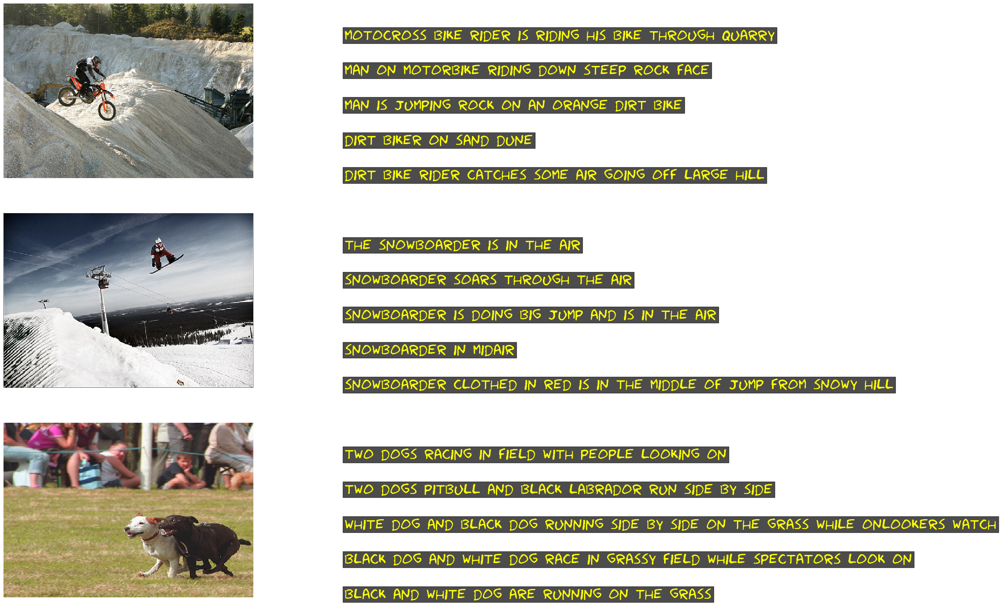

In [ ]:
def image_caption_plotter(data):
  npic = 3
  target_size = (350, 500, 3)
  count = 1
  fig = plt.figure(figsize=(25, 22))
  for file in tqdm(random.sample(list(data['filename']), npic)):
    captions = list(data['caption'].loc[data['filename'] == file].values)
    image_load = load_img(file, target_size = target_size)
    ax = fig.add_subplot(npic, 2, count)
    ax.axis('off')
    ax.imshow(image_load, interpolation='nearest')
    count += 1
    ax = fig.add_subplot(npic, 2, count)
    ax.axis('off')
    ax.set_ylim(0, len(captions))
    for i, caption in enumerate(captions):
      ax.text(0, i, caption, fontsize = 30, fontfamily= 'fantasy', bbox=dict(facecolor='black', alpha=0.7), color='yellow')
    count += 1
    plt.grid(None)
  plt.show()

image_caption_plotter(data_df)

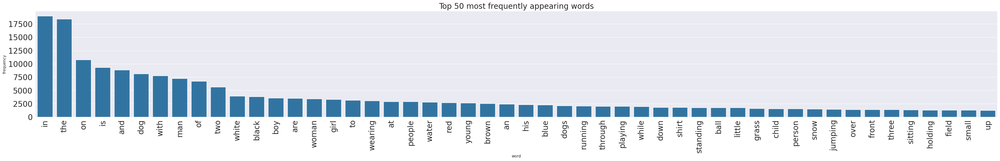

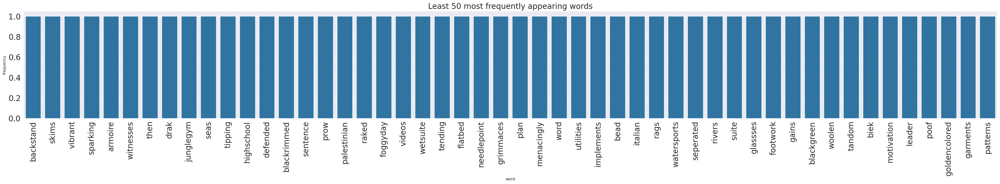

In [ ]:
count = 50

def plot_word_count(df, title = ''):
    sns.set_style('darkgrid')
    plt.figure(figsize = (45, 5))
    sns.barplot(x=df['word'], y=df["frequency"])
    plt.yticks(fontsize = 20)
    plt.xticks( rotation = 'vertical', fontsize = 20)
    plt.title(title, fontsize = 20)
    plt.show()

plot_word_count(df_word_count.iloc[:count, :], title= 'Top 50 most frequently appearing words')
plot_word_count(df_word_count.iloc[-count:, :], title= 'Least 50 most frequently appearing words')

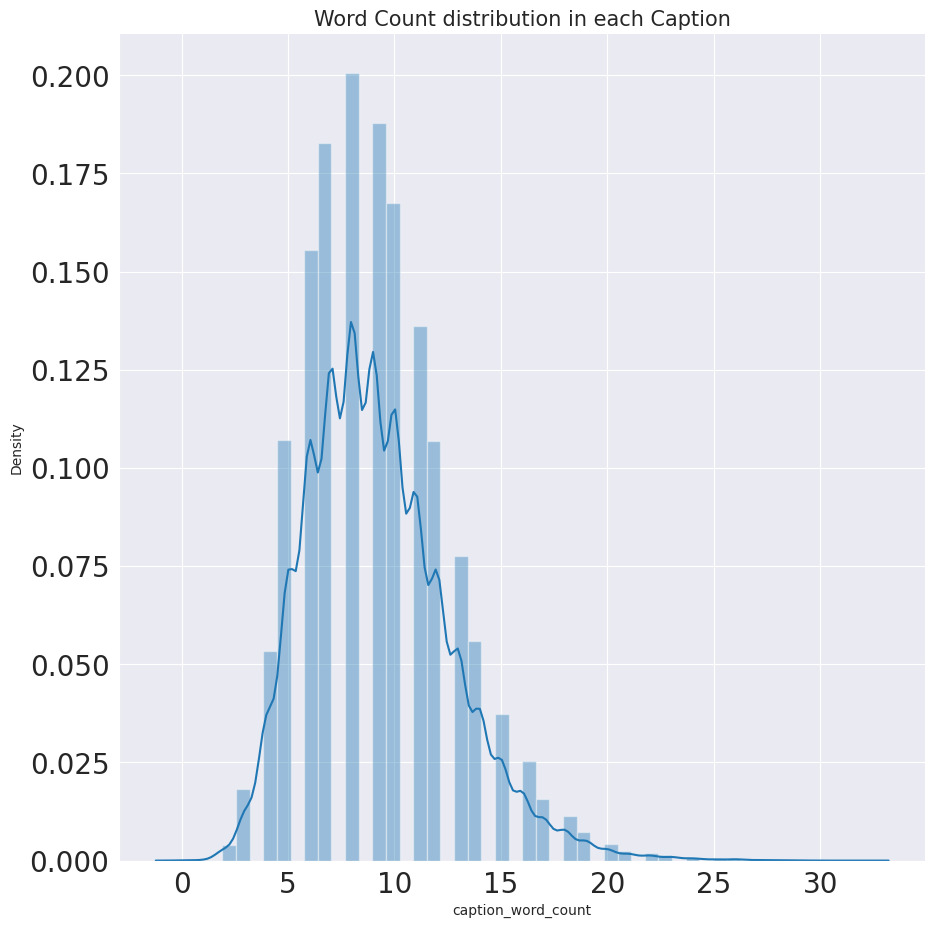

In [ ]:
sns.set_style('darkgrid')
sns.FacetGrid(data_df, height = 9).map(sns.distplot, 'caption_word_count').add_legend()
plt.yticks(fontsize = 20)
plt.xticks(fontsize = 20)
plt.title('Word Count distribution in each Caption', fontsize = 15)
plt.show()

In [ ]:
train_images_file = '/content/drive/MyDrive/ICG/Flickr8k_text/Flickr_8k.trainImages.txt'
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))
train_filename_container = [image_path+filename for filename in train_images if image_path+filename in images_lst]

validation_images_file = '/content/drive/MyDrive/ICG/Flickr8k_text/Flickr_8k.devImages.txt'
validation_images = set(open(validation_images_file, 'r').read().strip().split('\n'))
validation_filename_container = [image_path+filename for filename in validation_images if image_path+filename in images_lst]

train_filename_container = train_filename_container+validation_filename_container

test_images_file = '/content/drive/MyDrive/ICG/Flickr8k_text/Flickr_8k.testImages.txt'
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))
test_filename_container = [image_path+filename for filename in test_images if image_path+filename in images_lst]

In [ ]:

def augument_image(image_path, aug=True, visualize=False):
  if visualize:
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
  else:
    image = load_img(image_path, target_size=(224, 224))
    image = img_to_array(image)
  if aug:
    aug2 = iaa.Fliplr(1)
    aug3 = iaa.Flipud(1)
    aug4 = iaa.Emboss(alpha=(1), strength=1)
    aug5 = iaa.DirectedEdgeDetect(alpha=(0.8), direction=(1.0))
    aug6 = iaa.Sharpen(alpha=(1.0), lightness=(1.5))

    a = np.random.uniform()
    if a<0.2:
      aug_image = aug2.augment_image(image)
    elif a<0.4:
      aug_image = aug3.augment_image(image)
    elif a<0.6:
      aug_image = aug4.augment_image(image)
    elif a<0.8:
      aug_image = aug5.augment_image(image)
    else:
      aug_image = aug6.augment_image(image)
    return image, aug_image
  else:
    return image

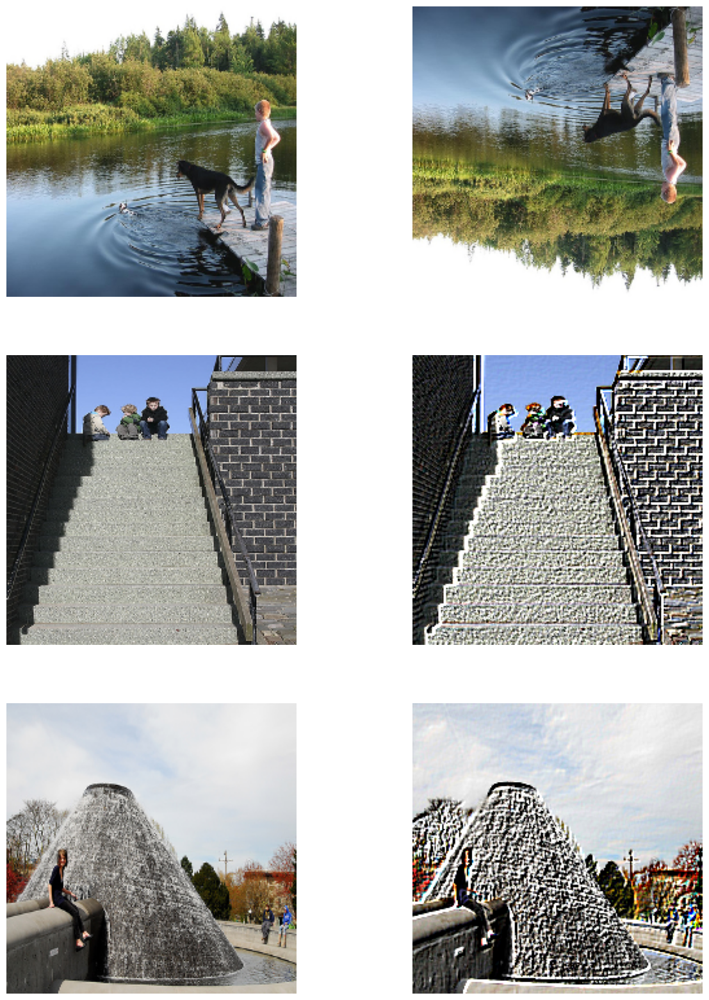

In [ ]:
row = 3
col = 2
dataset = [augument_image(train_filename_container[np.random.randint(0, 5000)], aug=True, visualize=True) for _ in range(0, 3)]
fig = plt.figure(figsize=(15, 20))
for counter in range(0, row*col):
  fig.add_subplot(row, col, counter+1)
  plt.imshow((dataset[int(counter/2)][counter%2]))
  plt.axis('off')
  plt.grid(None)

In [ ]:
train_caption_mapping = {}
for file in tqdm(train_filename_container):
    train_caption_mapping[file]= list(data_df.loc[data_df['filename'] == file].caption_with_tags)

test_caption_mapping = {}
for file in tqdm(test_filename_container):
    test_caption_mapping[file]= list(data_df.loc[data_df['filename'] == file].caption_with_tags)

100%|██████████| 1000/1000 [00:03<00:00, 279.47it/s]


In [ ]:
def encode_image(filename_container, aug=True):
  encoding = {}
  augmented_image_path = []
  for image_path in tqdm(filename_container):
    image = augument_image(image_path, aug=aug)
    if aug:
      image = preprocess_input(image[0])
      aug_image = preprocess_input(image[1])

      features = model_new(np.expand_dims(image, axis=0))
      features = np.reshape(features, (features.shape[1],))
      features_aug = model_new(np.expand_dims(image, axis=0))
      features_aug = np.reshape(features_aug, (features_aug.shape[1],))

      encoding[image_path] = features
      aug_path = image_path[:-4]+'_aug.jpg'
      augmented_image_path.append(aug_path)
      train_caption_mapping[aug_path] = train_caption_mapping[image_path]
      encoding[aug_path] = features_aug
    else:
      image = preprocess_input(image)
      features = model_new(np.expand_dims(image, axis=0))
      fearures = np.reshape(features, (features.shape[1],))
      encoding[image_path] = features
  global train_filename_container
  train_filename_container += augmented_image_path
  return encoding

In [ ]:
model_vgg16 = VGG16(weights='imagenet', include_top=True)
model_new = Model(model_vgg16.input, model_vgg16.layers[-2].output)

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


In [ ]:
encoding_train = encode_image(train_filename_container)
with open('/content/encoded_train_image_features.pkl', 'wb') as p:
    dump(encoding_train, p)


  1%|▏         | 97/7000 [01:01<1:14:04,  1.55it/s]

In [ ]:
encoding_test = encode_image(test_filename_container, aug=False)
with open('/content/encoded_test_image_feature.pkl', 'wb') as p:
    dump(encoding_test, p)

  0%|          | 4/1000 [00:05<24:45,  1.49s/it]


KeyboardInterrupt: 

In [ ]:
train_features = load(open("/content/encoded_train_image_features.pkl", "rb"))
print('Number of train image features', len(train_features))

test_features = load(open("/content/encoded_test_image_feature.pkl", "rb"))
print('Number of test image features', len(test_features))

Number of train image features 14000
Number of test image features 1000


In [ ]:
all_train_captions = set()
for _, caption_lst in tqdm(train_caption_mapping.items()):
    for caption in caption_lst:
        all_train_captions.add(caption)

all_test_captions = set()
for _, caption_lst in tqdm(test_caption_mapping.items()):
    for caption in caption_lst:
        all_test_captions.add(caption)

100%|██████████| 1000/1000 [00:00<00:00, 396887.21it/s]


In [ ]:
train_tokenizer

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd
from tqdm import tqdm

# Initialize the tokenizer and fit on all training captions
train_tokenizer = Tokenizer(oov_token='<UNK>')
train_tokenizer.fit_on_texts(all_train_captions)

# Convert all captions into sequences of word indices
train_sequences = train_tokenizer.texts_to_sequences(all_train_captions)

# Add padding to sequences (this is where you implement padding)
# padding='post' ensures padding is added to the end of the sequences
padded_train_sequences = pad_sequences(train_sequences, padding='post',value=0)

# If you need to check word frequencies as before, you can proceed with this part
words = []
frequency = []
for word, freq in tqdm(train_tokenizer.word_counts.items()):
    words.append(word)
    frequency.append(freq)

df_wc_train = pd.DataFrame({'word': words, 'frequency': frequency})
df_wc_train.sort_values('frequency', ascending=False, inplace=True, ignore_index=True)


100%|██████████| 8169/8169 [00:00<00:00, 1132632.62it/s]


In [ ]:
ixtoword = dict((index, word) for word, index in train_tokenizer.word_index.items())
wordtoix = train_tokenizer.word_index
max_length = max(map(lambda caption: len(caption.split()), all_train_captions))
vocab_size = len(wordtoix)+1

In [ ]:
wordtoix

{'<UNK>': 1,
 'startseq': 2,
 'endseq': 3,
 'in': 4,
 'the': 5,
 'on': 6,
 'is': 7,
 'and': 8,
 'dog': 9,
 'with': 10,
 'man': 11,
 'of': 12,
 'two': 13,
 'white': 14,
 'black': 15,
 'boy': 16,
 'woman': 17,
 'are': 18,
 'girl': 19,
 'to': 20,
 'wearing': 21,
 'people': 22,
 'at': 23,
 'water': 24,
 'red': 25,
 'brown': 26,
 'young': 27,
 'an': 28,
 'his': 29,
 'blue': 30,
 'running': 31,
 'dogs': 32,
 'through': 33,
 'playing': 34,
 'while': 35,
 'down': 36,
 'shirt': 37,
 'ball': 38,
 'standing': 39,
 'little': 40,
 'grass': 41,
 'child': 42,
 'person': 43,
 'snow': 44,
 'jumping': 45,
 'over': 46,
 'three': 47,
 'sitting': 48,
 'front': 49,
 'holding': 50,
 'field': 51,
 'small': 52,
 'large': 53,
 'by': 54,
 'up': 55,
 'yellow': 56,
 'green': 57,
 'one': 58,
 'group': 59,
 'walking': 60,
 'her': 61,
 'children': 62,
 'men': 63,
 'into': 64,
 'air': 65,
 'near': 66,
 'mouth': 67,
 'beach': 68,
 'jumps': 69,
 'another': 70,
 'for': 71,
 'from': 72,
 'runs': 73,
 'street': 74,
 'its':

In [ ]:
ixtoword

{1: '<UNK>',
 2: 'startseq',
 3: 'endseq',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'woman',
 18: 'are',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'red',
 26: 'brown',
 27: 'young',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'running',
 32: 'dogs',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'shirt',
 38: 'ball',
 39: 'standing',
 40: 'little',
 41: 'grass',
 42: 'child',
 43: 'person',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'three',
 48: 'sitting',
 49: 'front',
 50: 'holding',
 51: 'field',
 52: 'small',
 53: 'large',
 54: 'by',
 55: 'up',
 56: 'yellow',
 57: 'green',
 58: 'one',
 59: 'group',
 60: 'walking',
 61: 'her',
 62: 'children',
 63: 'men',
 64: 'into',
 65: 'air',
 66: 'near',
 67: 'mouth',
 68: 'beach',
 69: 'jumps',
 70: 'another',
 71: 'for',
 72: 'from',
 73: 'runs',
 74: 'street',
 75: 'i

In [ ]:
import pickle

In [ ]:
# Save the word to index mappings
with open('wordtoix.pkl', 'wb') as f:
    pickle.dump(wordtoix, f)

with open('ixtoword.pkl', 'wb') as f:
    pickle.dump(ixtoword, f)

In [ ]:


with open('train_tokenizer.pkl', 'wb') as f:
    pickle.dump(ixtoword, f)

In [ ]:
def dataset_loader(tokenizer, image_caption_mapping, image_features, max_length, images_per_batch, vocab_size):
    image_feature, input_seq, output_seq = list(), list(), list()
    image_count=0
    while 1:
        for image_path, captions in image_caption_mapping.items():
            image_count+=1
            feature = image_features[image_path]
            sequences = tokenizer.texts_to_sequences(captions)
            for seq in sequences:
              for i in range(1, len(seq)):
                  in_seq, out_seq = seq[:i], seq[i]                                                       # split into input and output pair
                  in_seq = pad_sequences([in_seq], maxlen=max_length)[0]                                  # pad input sequence
                  out_seq = tf.keras.utils.to_categorical([out_seq], num_classes=vocab_size)[0]           # encode output sequence
                  image_feature.append(feature)
                  input_seq.append(in_seq)
                  output_seq.append(out_seq)
            if image_count==images_per_batch:                                                             # yield the batch data
                yield (np.array(image_feature), np.array(input_seq)), np.array(output_seq)
                image_feature, input_seq, output_seq = list(), list(), list()
                image_count=0


In [ ]:
input_image = Input(shape=(4096, ), name='Image_Feature_input')
fe1 = Dropout(0.5, name='Dropout_image')(input_image)
fe2 = Dense(256, activation='relu', name='Activation_Encoder')(fe1)
input_text = Input(shape=(max_length,), name='Text_input')
se1 = Embedding(vocab_size, 500, mask_zero=True, name='Text_Feature')(input_text)
se2 = Dropout(0.5, name='Dropout_text')(se1)
se3 = LSTM(512, name='LSTM', return_sequences=True, use_cudnn=False)(se2)
se4 = SeqSelfAttention(attention_activation='sigmoid', name='Self-Attention')(se3)
se5 = Flatten()(se4)
se6 = Dense(256, activation='relu')(se5)
decoder1 = Concatenate(name='Concatenate')([fe2, se6])
decoder2 = Dense(256, activation='relu', name='Activation_Decoder')(decoder1)
output = Dense(vocab_size, activation='softmax',name='Output')(decoder2)
model = Model(inputs=[input_image, input_text], outputs=output)

In [ ]:
from keras.preprocessing.sequence import pad_sequences

# Example input sequences
sequences = [[1, 2, 3], [4, 5], [6]]  # Varying lengths
padded_sequences = pad_sequences(sequences, padding='post', value=0)

# Now padded_sequences should look like this: [[1, 2, 3], [4, 5, 0], [6, 0, 0]]
print(padded_sequences)



[[1 2 3]
 [4 5 0]
 [6 0 0]]


In [ ]:
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ Text_input (InputLayer)   │ (None, 34)             │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Text_Feature (Embedding)  │ (None, 34, 500)        │      4,085,500 │ Text_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Dropout_text (Dropout)    │ (None, 34, 500)        │              0 │ Text_Feature[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal_8 (NotEqual)    │ (None, 34)             │              0 │ Text_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM (LSTM)               │ (None, 34, 512)        │      2,074,624 │ Dropout_text[0][0],    │
│                           │                        │                │ not_equal_8[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Image_Feature_input       │ (None, 4096)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Self-Attention            │ (None, 34, 512)        │         32,833 │ LSTM[0][0],            │
│ (SeqSelfAttention)        │                        │                │ not_equal_8[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Dropout_image (Dropout)   │ (None, 4096)           │              0 │ Image_Feature_input[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 17408)          │              0 │ Self-Attention[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Activation_Encoder        │ (None, 256)            │      1,048,832 │ Dropout_image[0][0]    │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 256)            │      4,456,704 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate (Concatenate) │ (None, 512)            │              0 │ Activation_Encoder[0]… │
│                           │                        │                │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Activation_Decoder        │ (None, 256)            │        131,328 │ Concatenate[0][0]      │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Output (Dense)            │ (None, 8171)           │      2,099,947 │ Activation_Decoder[0]… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 13,929,768 (53.14 MB)

 Trainable params: 13,929,768 (53.14 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
filepath = 'model-ep{epoch:03d}-loss{loss:.3f}.keras'
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
log_dir = "logs/fit/"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard = TensorBoard(log_dir = log_dir, histogram_freq=1)

In [ ]:
number_pics_per_bath = 16
steps = len(train_caption_mapping)//number_pics_per_bath
learning_rate = 0.001



In [ ]:
train_generator = dataset_loader(train_tokenizer, train_caption_mapping, train_features, max_length, number_pics_per_bath, vocab_size)


In [ ]:
history = model.fit(train_generator, epochs=10, steps_per_epoch=steps, verbose=1, callbacks = [checkpoint, tensorboard])


In [ ]:
# Continue training for an additional 25 epochs
total_epochs = 10 + 5  # 10 already trained + 25 additional
history = model.fit(
    train_generator,
    epochs=total_epochs,
    initial_epoch=10,  # Start from the 10th epoch
    steps_per_epoch=steps,
    verbose=1,
    callbacks=[checkpoint, tensorboard]
)


In [ ]:
# Continue training for an additional 25 epochs
total_epochs = 20  # 10 already trained + 25 additional
history = model.fit(
    train_generator,
    epochs=total_epochs,
    initial_epoch=15,  # Start from the 10th epoch
    steps_per_epoch=steps,
    verbose=1,
    callbacks=[checkpoint, tensorboard]
)


In [ ]:
# Continue training for an additional 25 epochs
total_epochs = 25  # 10 already trained + 25 additional
history = model.fit(
    train_generator,
    epochs=total_epochs,
    initial_epoch=20,  # Start from the 10th epoch
    steps_per_epoch=steps,
    verbose=1,
    callbacks=[checkpoint, tensorboard]
)


In [ ]:
from keras.models import load_model

# Load the saved model
model = load_model('model-ep020-loss1.879.keras')


In [ ]:
# Define the number of additional epochs
additional_epochs = 1
total_epochs = 20 + additional_epochs  # 20 epochs total after loading the model

history = model.fit(
    train_generator,
    epochs=total_epochs,
    initial_epoch=20,  # Start from the 20th epoch (continuing from the last saved epoch)
    steps_per_epoch=steps,
    verbose=1,
    callbacks=[checkpoint, tensorboard]  # Ensure callbacks are defined
)


Epoch 21/21


InvalidArgumentError: Graph execution error:

Detected at node functional_1_1/LSTM_1/Assert/Assert defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-85-8931dfc309e0>", line 5, in <cell line: 5>

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 318, in fit

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 121, in one_step_on_iterator

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 108, in one_step_on_data

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 51, in train_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 882, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 175, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 556, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 882, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/lstm.py", line 570, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py", line 406, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/lstm.py", line 537, in inner_loop

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/rnn.py", line 841, in lstm

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/rnn.py", line 874, in _cudnn_lstm

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/rnn.py", line 557, in _assert_valid_mask

assertion failed: [You are passing a RNN mask that does not correspond to right-padded sequences, while using cuDNN, which is not supported. With cuDNN, RNN masks can only be used for right-padding, e.g. `[[True, True, False, False]]` would be a valid mask, but any mask that isn\'t just contiguous `True`\'s on the left and contiguous `False`\'s on the right would be invalid. You can pass `use_cudnn=False` to your RNN layer to stop using cuDNN (this may be slower).]
	 [[{{node functional_1_1/LSTM_1/Assert/Assert}}]] [Op:__inference_one_step_on_iterator_39526]

AttributeError: 'Functional' object has no attribute 'history'

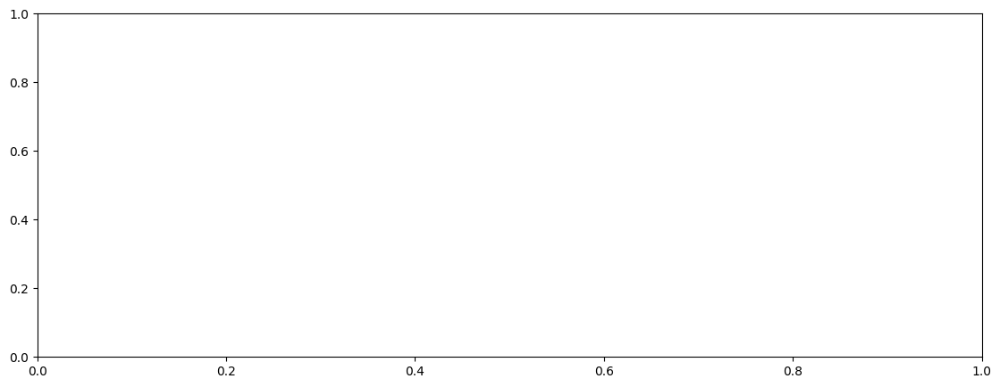

In [ ]:

plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['loss'])
plt.plot(history.history['accuracy'])
plt.title('Model - Loss/Accuracy', fontsize=20)
plt.ylabel('Loss/Accuracy')
plt.xlabel('Epoch')
plt.legend(['Loss', 'Accuracy'], loc='upper left')

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 18368), started 0:11:06 ago. (Use '!kill 18368' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
def greedySearch(image):
    image = encoding_test[image]
    image = np.reshape(image, (1,4096))
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[word] for word in in_text.split()]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([image,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat].lower()
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import matplotlib.pyplot as plt
import random
from keras.utils import load_img
from tqdm import tqdm

def image_caption_score_extractor(data):
    npic = 6
    target_size = (224, 224, 3)
    count = 1
    fig = plt.figure(figsize=(60, 65))

    for file in tqdm(random.sample(test_filename_container, npic)):
        predicted_caption = greedySearch(file)
        captions = list(data['caption'].loc[data['filename'] == file].values)
        image_load = load_img(file, target_size=target_size)

        # Plot image
        ax = fig.add_subplot(npic, 2, count)
        ax.axis('off')
        ax.imshow(image_load, interpolation='nearest')

        # Process captions and calculate BLEU score
        reference = [caption.lower().split() for caption in captions]  # Lowercase for uniformity
        candidate = predicted_caption.lower().split()                  # Lowercase for uniformity

        # Using smoothing to avoid harsh scores for short sentences
        score = round(sentence_bleu(reference, candidate, smoothing_function=SmoothingFunction().method4), 3)

        # Plot reference captions and predicted caption with BLEU score
        count += 1
        ax = fig.add_subplot(npic, 2, count)
        ax.axis('off')
        ax.set_ylim(0, len(captions) + 2)

        for i, caption in enumerate(captions):
            ax.text(0, i, caption, fontsize=40, bbox=dict(facecolor='blue', alpha=0.1), color='red')

        ax.text(0, i+1, greedySearch(file), fontsize=40)
        ax.text(0, i+2, f'BLEU Score: {score}', fontsize=40, fontfamily='fantasy', bbox=dict(facecolor='white', alpha=0.7), color='blue')

        count += 1

    plt.grid(None)
    plt.show()

# Example usage
image_caption_score_extractor(data_df)


  0%|          | 0/6 [00:00<?, ?it/s]


InvalidArgumentError: Graph execution error:

Detected at node functional_1_1/LSTM_1/Assert/Assert defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-61-89adf6c12ea1>", line 48, in <cell line: 48>

  File "<ipython-input-61-89adf6c12ea1>", line 14, in image_caption_score_extractor

  File "<ipython-input-60-bdccf7fef75d>", line 8, in greedySearch

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 508, in predict

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 208, in one_step_on_data_distributed

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 198, in one_step_on_data

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 96, in predict_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 882, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 175, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 556, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 882, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/lstm.py", line 570, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py", line 406, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/lstm.py", line 537, in inner_loop

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/rnn.py", line 841, in lstm

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/rnn.py", line 874, in _cudnn_lstm

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/rnn.py", line 557, in _assert_valid_mask

assertion failed: [You are passing a RNN mask that does not correspond to right-padded sequences, while using cuDNN, which is not supported. With cuDNN, RNN masks can only be used for right-padding, e.g. `[[True, True, False, False]]` would be a valid mask, but any mask that isn\'t just contiguous `True`\'s on the left and contiguous `False`\'s on the right would be invalid. You can pass `use_cudnn=False` to your RNN layer to stop using cuDNN (this may be slower).]
	 [[{{node functional_1_1/LSTM_1/Assert/Assert}}]] [Op:__inference_one_step_on_data_distributed_29189]

<Figure size 6000x6500 with 0 Axes>

In [ ]:
def generate_caption(model, tokenizer, image_feature, max_length):
    # Start with the beginning of sequence token
    in_text = 'startseq'

    # Generate caption word by word
    for i in range(max_length):
        # Convert the input sequence of words to indices
        sequence = tokenizer.texts_to_sequences([in_text])[0]

        # Pad the sequence to ensure it's the same length as the max_length
        sequence = pad_sequences([sequence], maxlen=max_length)

        # Predict the next word in the sequence using the model
        yhat = model.predict([image_feature, sequence], verbose=0)

        # Get the index of the word with the highest probability
        yhat = np.argmax(yhat)

        # Convert the index back to a word
        word = ixtoword[yhat]

        # Add the word to the input text
        in_text += ' ' + word

        # Stop if the end sequence token is generated
        if word == 'endseq':
            break

    # Return the generated caption, without the start and end sequence tokens
    final_caption = in_text.split()[1:-1]
    return ' '.join(final_caption)


In [ ]:
# Function for generating caption
def generate_caption(image_name):
    # load the image
    image_id = image_name.split('.')[0]
    img_path = os.path.join(INPUT_DIR, "Images", image_name)
    image = Image.open(img_path)
    captions = image_to_captions_mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, loaded_features[image_id], tokenizer, max_caption_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)